In [1]:
# ========================================
# 1. Mount Google Drive
# ========================================
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# ========================================
# 2. Import libraries
# ========================================
import zipfile
import os
import random
import matplotlib.pyplot as plt
import skimage.io as io
from pycocotools.coco import COCO
import numpy as np

In [3]:
# ========================================
# 3. File paths (adjusted to your Drive structure)
# ========================================
zip_val = "/content/drive/MyDrive/infosys_ai_vision_extract/val2017.zip"
zip_ann = "/content/drive/MyDrive/infosys_ai_vision_extract/annotations_trainval2017.zip"

In [4]:
# Extract validation images
with zipfile.ZipFile(zip_val, 'r') as zip_ref:
    zip_ref.extractall("/content")


In [5]:
# Extract annotations
with zipfile.ZipFile(zip_ann, 'r') as zip_ref:
    zip_ref.extractall("/content")

In [6]:
# ========================================
# 4. Initialize COCO API
# ========================================
annFile = '/content/annotations/instances_val2017.json'
coco = COCO(annFile)

loading annotations into memory...
Done (t=0.47s)
creating index...
index created!


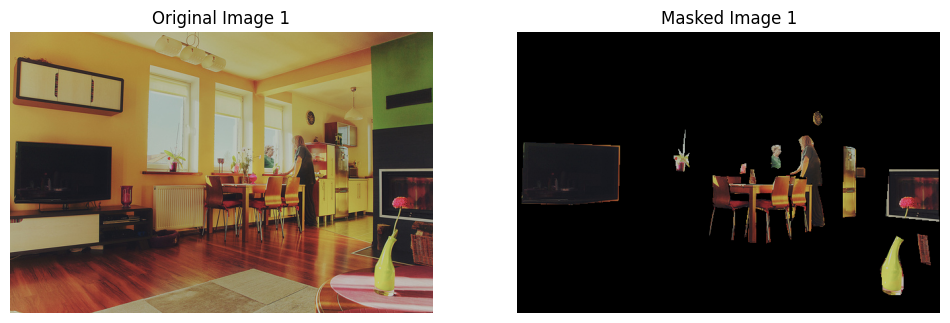

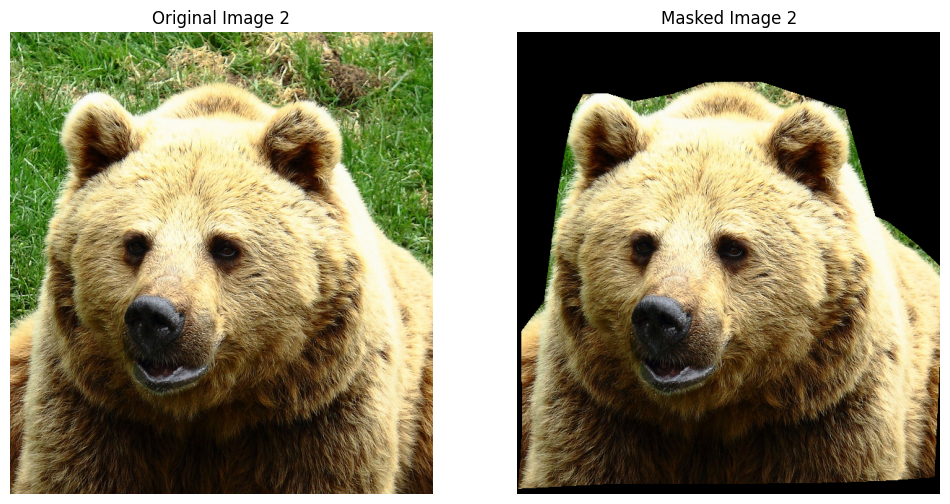

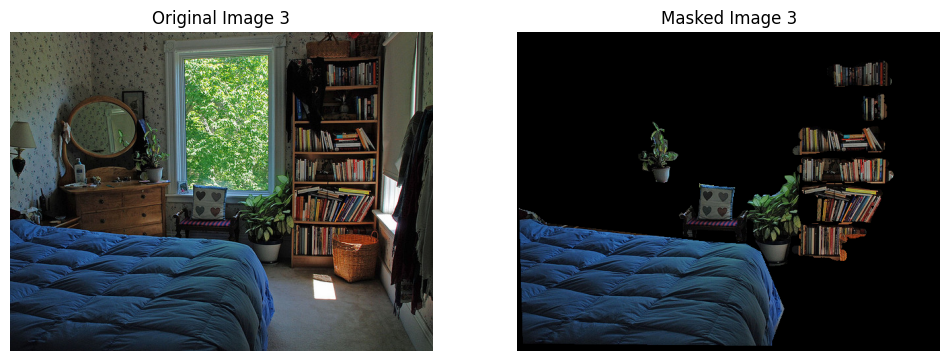

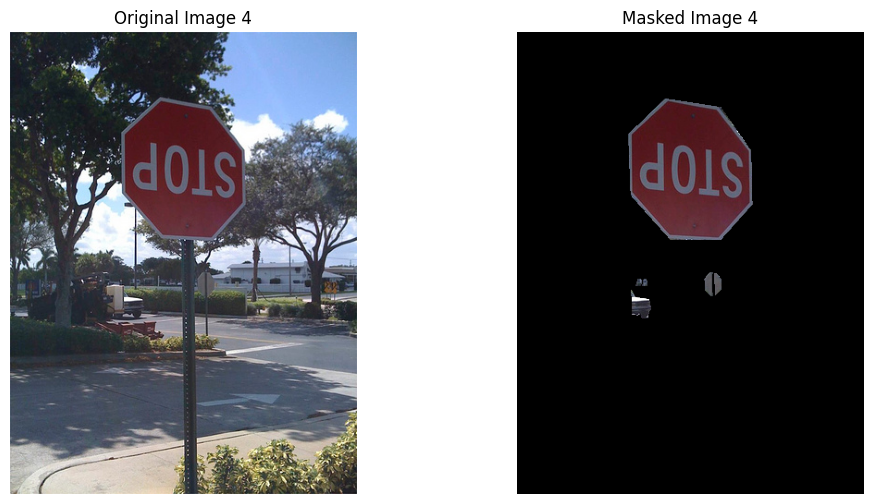

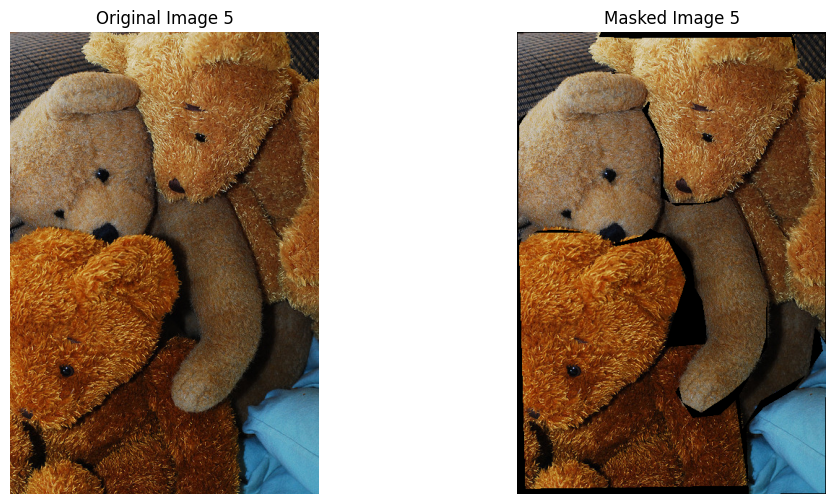

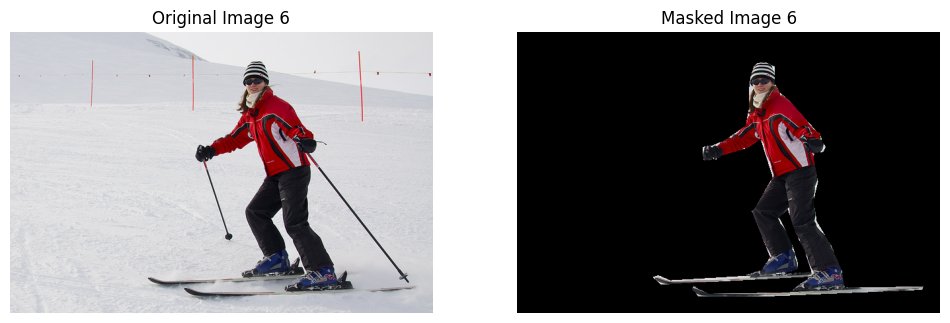

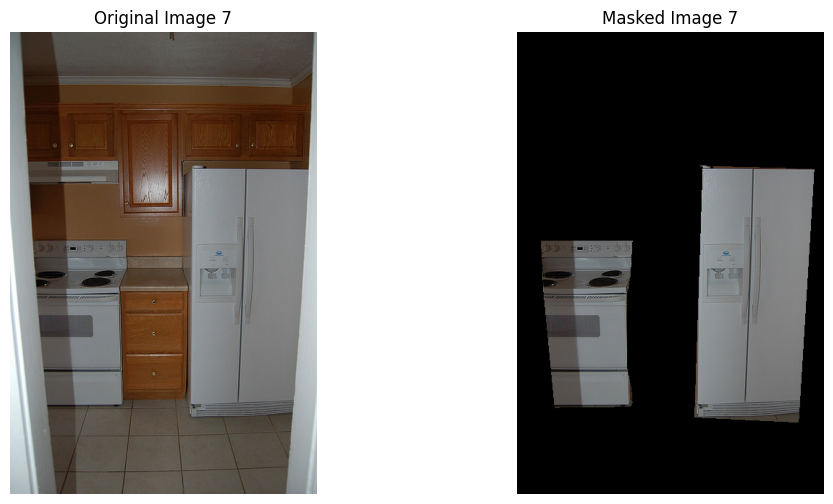

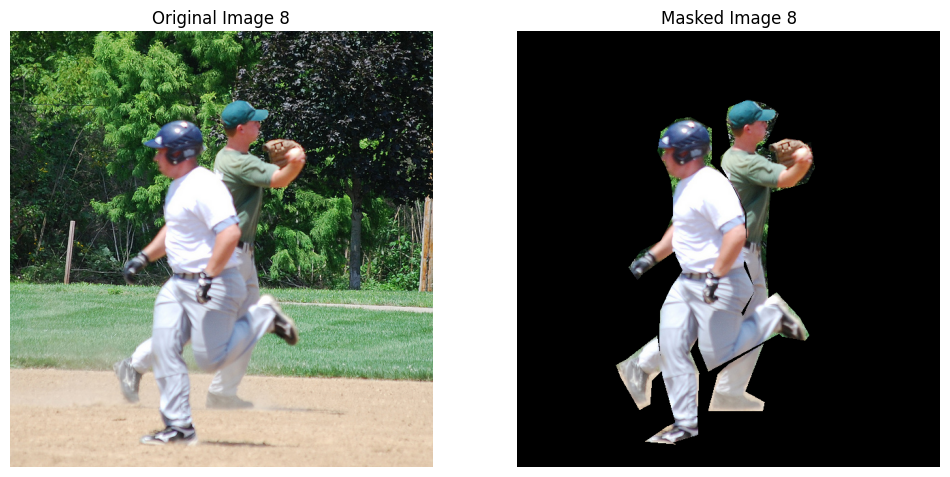

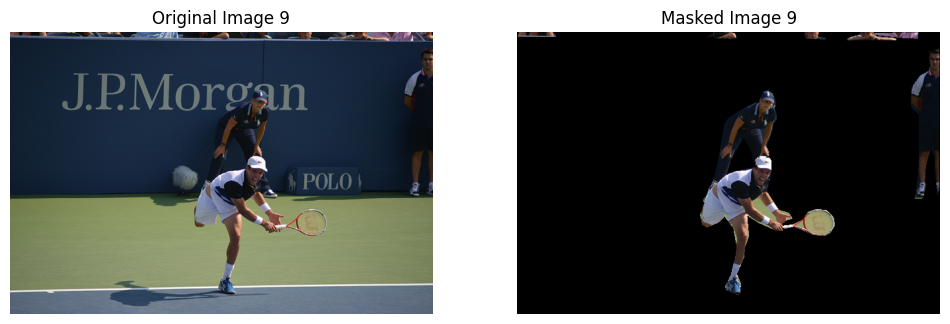

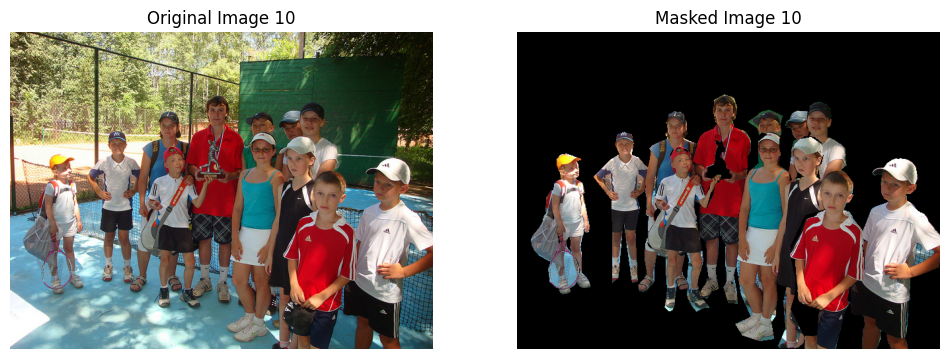

In [7]:
import glob

# Path to extracted validation images
val_dir = "/content/val2017"

# Get sorted list of image filenames
val_images = sorted(glob.glob(val_dir + "/*.jpg"))

# Take first 10 images
val_images_10 = val_images[:10]

for idx, img_path in enumerate(val_images_10):
    # Get image ID (from filename)
    img_id = int(os.path.basename(img_path).split(".")[0])

    # Load image
    I = io.imread(img_path)

    # Get annotations
    ann_ids = coco.getAnnIds(imgIds=img_id, iscrowd=None)
    anns = coco.loadAnns(ann_ids)

    # Build mask
    mask = np.zeros((I.shape[0], I.shape[1]), dtype=np.uint8)
    for ann in anns:
        m = coco.annToMask(ann)
        mask = np.maximum(mask, m)

    # Apply mask
    masked_img = np.zeros_like(I)
    if I.ndim == 3:
        for c in range(3):
            masked_img[:, :, c] = I[:, :, c] * mask
    else:
        masked_img = I * mask

    # Show side by side
    plt.figure(figsize=(12,6))
    plt.subplot(1,2,1)
    plt.title(f"Original Image {idx+1}")
    plt.imshow(I)
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.title(f"Masked Image {idx+1}")
    plt.imshow(masked_img)
    plt.axis('off')

    plt.show()

loading annotations into memory...
Done (t=0.48s)
creating index...
index created!


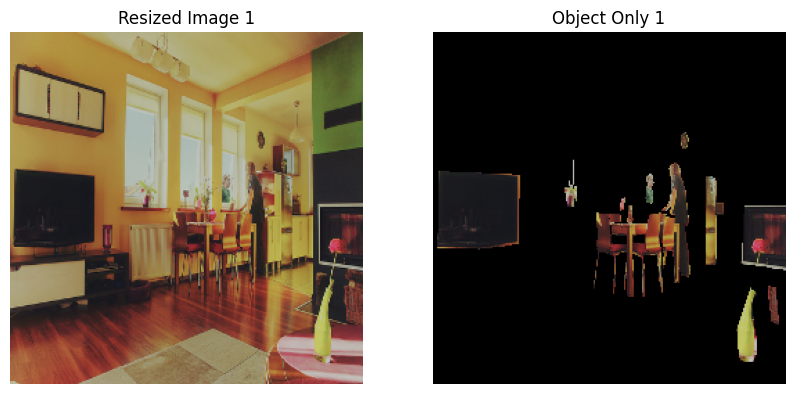

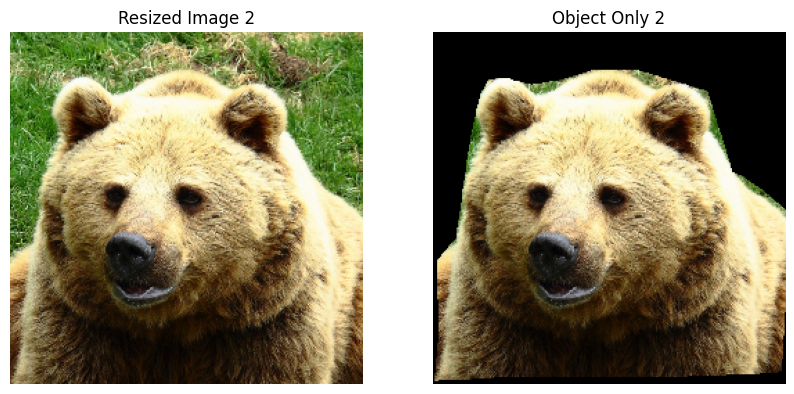

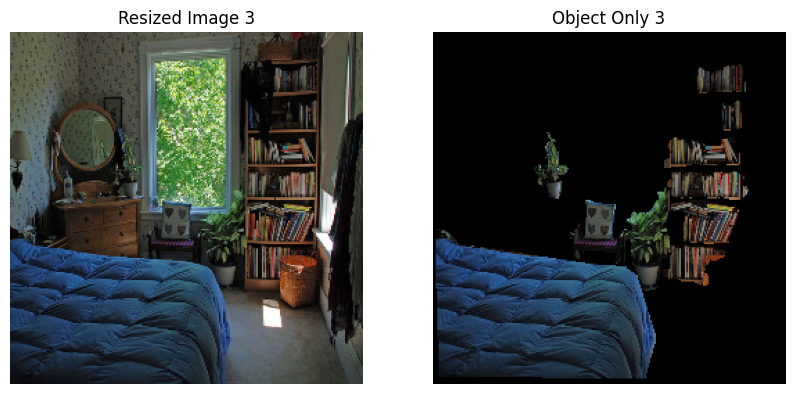

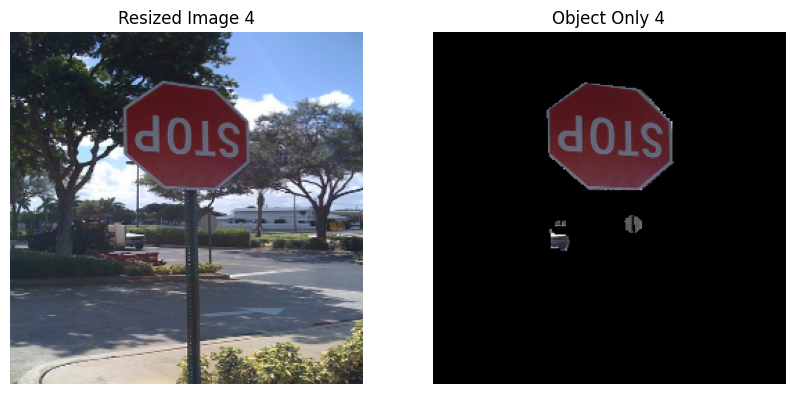

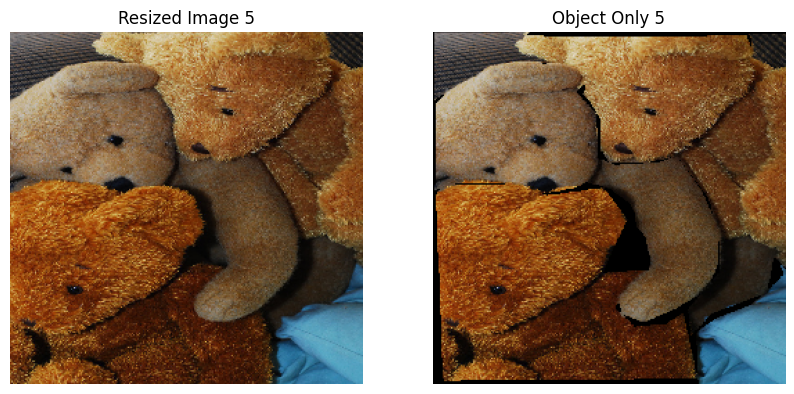

✅ All val2017 images processed: 255x255 resized + object-only masked


In [8]:
import cv2
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import skimage.io as io
from pycocotools.coco import COCO

# ================================
# Paths
# ================================
val_dir = "/content/val2017"
annFile = "/content/annotations/instances_val2017.json"
coco = COCO(annFile)

# ================================
# Collect all validation images
# ================================
val_images = sorted(glob.glob(val_dir + "/*.jpg"))

# Desired resize shape
resize_shape = (255, 255)

# ================================
# Loop through validation images
# ================================
for idx, img_path in enumerate(val_images):

    # Get image ID
    img_id = int(os.path.basename(img_path).split(".")[0])

    # Load image
    I = io.imread(img_path)

    # Convert grayscale → RGB
    if I.ndim == 2:
        I = cv2.cvtColor(I, cv2.COLOR_GRAY2RGB)

    # Load annotations for this image
    ann_ids = coco.getAnnIds(imgIds=img_id, iscrowd=None)
    anns = coco.loadAnns(ann_ids)

    # Build mask
    mask = np.zeros((I.shape[0], I.shape[1]), dtype=np.uint8)
    for ann in anns:
        m = coco.annToMask(ann)
        mask = np.maximum(mask, m)

    # Resize both image and mask
    I_resized = cv2.resize(I, resize_shape)
    mask_resized = cv2.resize(mask, resize_shape, interpolation=cv2.INTER_NEAREST)

    # Apply mask to keep object only (background black)
    masked_img = np.zeros_like(I_resized)
    for c in range(3):  # for each color channel
        masked_img[:, :, c] = I_resized[:, :, c] * mask_resized

    # (Optional) visualize first 5 only
    if idx < 5:
        plt.figure(figsize=(10,5))
        plt.subplot(1,2,1); plt.imshow(I_resized); plt.title(f"Resized Image {idx+1}"); plt.axis("off")
        plt.subplot(1,2,2); plt.imshow(masked_img); plt.title(f"Object Only {idx+1}"); plt.axis("off")
        plt.show()

print("✅ All val2017 images processed: 255x255 resized + object-only masked")


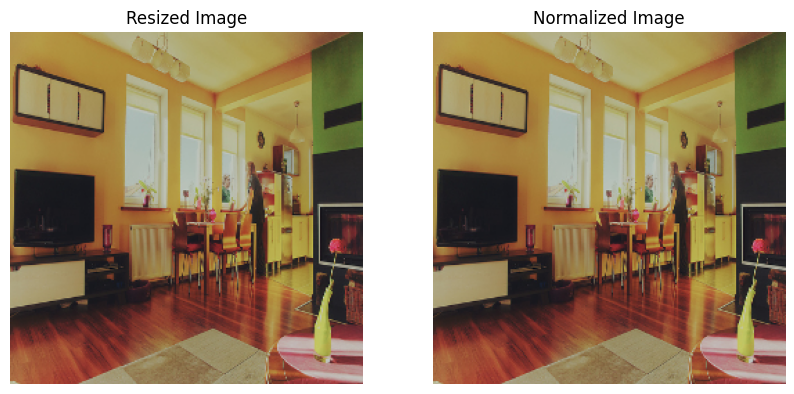

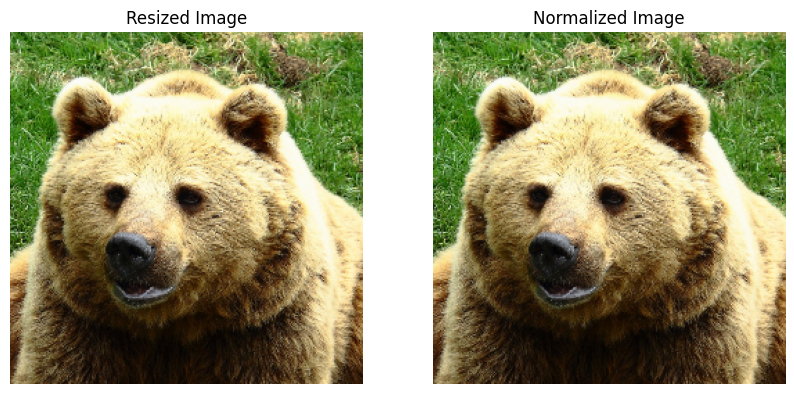

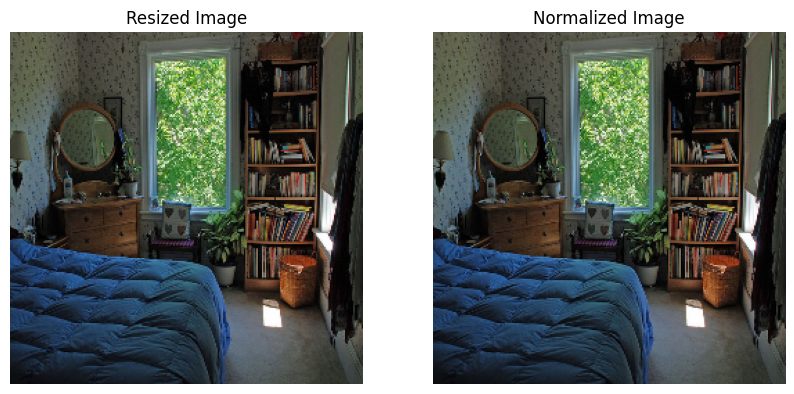

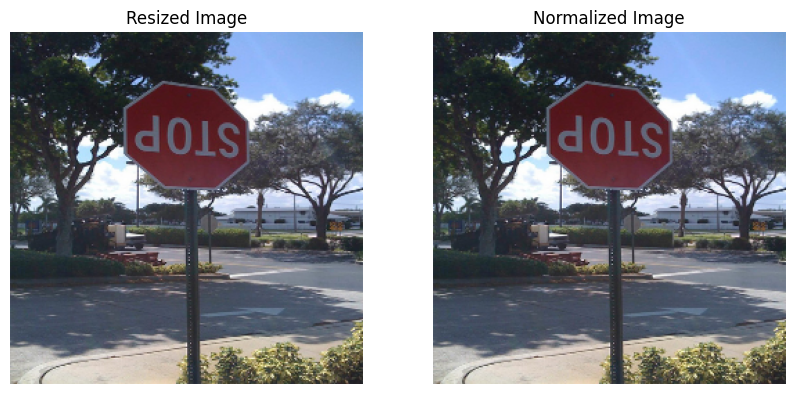

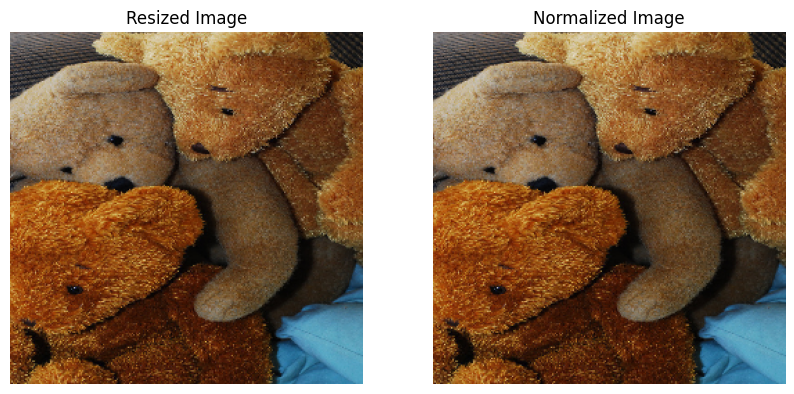

✅ Images resized to 255x255 and normalized to [0,1]


In [9]:
import cv2
import numpy as np
import glob
import os
import matplotlib.pyplot as plt

# ================================
# Path to resized validation images
# (we can reuse from val2017 directly since we resize on-the-fly)
# ================================
val_dir = "/content/val2017"
val_images = sorted(glob.glob(val_dir + "/*.jpg"))

resize_shape = (255, 255)

for idx, img_path in enumerate(val_images[:5]):  # demo on 5 images

    # Load image
    I = cv2.imread(img_path)

    # Convert BGR → RGB
    I = cv2.cvtColor(I, cv2.COLOR_BGR2RGB)

    # Resize
    I_resized = cv2.resize(I, resize_shape)

    # 🔹 Normalize to [0,1]
    I_normalized = I_resized.astype(np.float32) / 255.0

    # Show comparison
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1); plt.imshow(I_resized); plt.title("Resized Image"); plt.axis("off")
    plt.subplot(1,2,2); plt.imshow(I_normalized); plt.title("Normalized Image"); plt.axis("off")
    plt.show()

print("✅ Images resized to 255x255 and normalized to [0,1]")


In [10]:
import cv2
import os
import numpy as np
import albumentations as A
import matplotlib.pyplot as plt

# Paths
save_img_dir = "/content/augmented_dataset/images"
save_mask_dir = "/content/augmented_dataset/masks"
os.makedirs(save_img_dir, exist_ok=True)
os.makedirs(save_mask_dir, exist_ok=True)

# Desired resize size
resize_shape = (255, 255)

# Define augmentation pipeline
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.RandomRotate90(p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=30, p=0.5)
])

# Loop through ALL validation images
for idx, img_path in enumerate(val_images):
    img_id = int(os.path.basename(img_path).split(".")[0])
    I = io.imread(img_path)

    # Build mask from annotations
    ann_ids = coco.getAnnIds(imgIds=img_id, iscrowd=None)
    anns = coco.loadAnns(ann_ids)
    mask = np.zeros((I.shape[0], I.shape[1]), dtype=np.uint8)
    for ann in anns:
        m = coco.annToMask(ann)
        mask = np.maximum(mask, m)

    # Resize image and mask
    I_resized = cv2.resize(I, resize_shape)
    mask_resized = cv2.resize(mask, resize_shape, interpolation=cv2.INTER_NEAREST)

    # Apply augmentation
    augmented = transform(image=I_resized, mask=mask_resized)
    I_aug = augmented["image"]
    mask_aug = augmented["mask"]

    # Save augmented versions
    cv2.imwrite(f"{save_img_dir}/aug_{idx}.jpg", cv2.cvtColor(I_aug, cv2.COLOR_RGB2BGR))
    cv2.imwrite(f"{save_mask_dir}/aug_{idx}.png", mask_aug)

print("✅ All augmented images and masks saved to dataset!")


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


✅ All augmented images and masks saved to dataset!


Showing 5 augmented samples from: /content/augmented_dataset/images / /content/augmented_dataset/masks


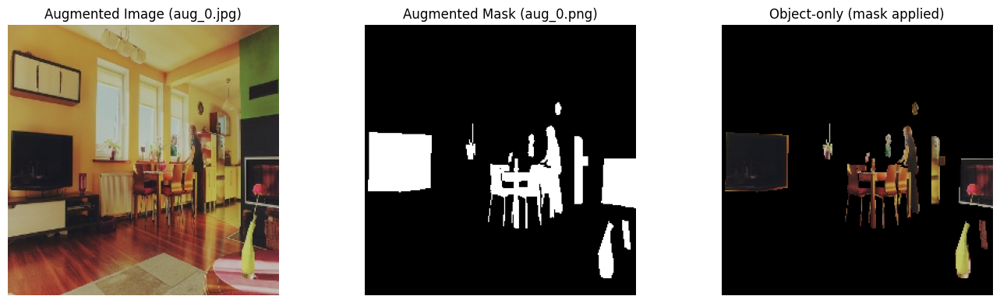

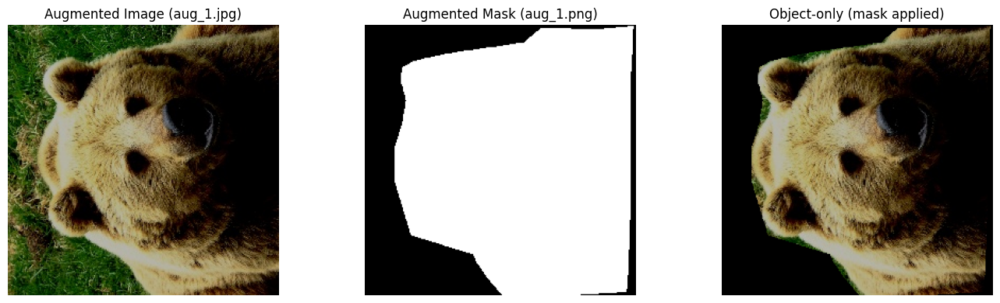

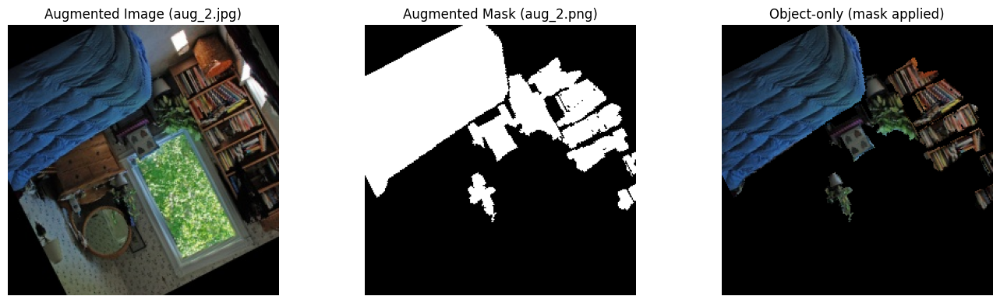

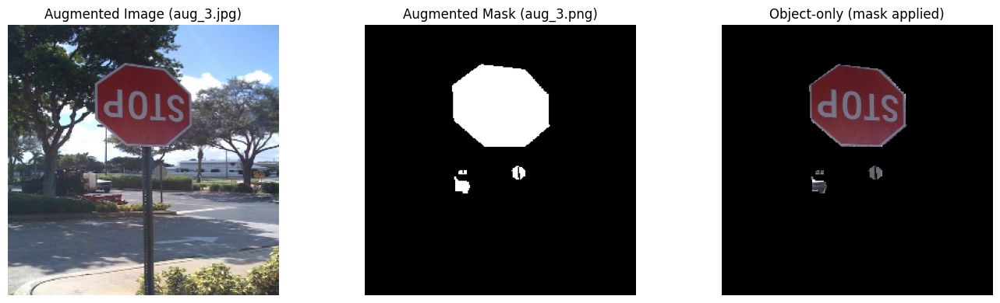

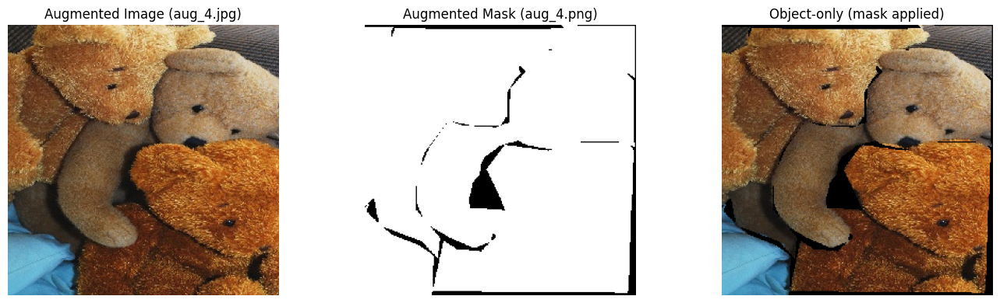

In [11]:
import os, re, glob, random
import cv2
import numpy as np
import matplotlib.pyplot as plt

aug_img_dir = "/content/augmented_dataset/images"
aug_mask_dir = "/content/augmented_dataset/masks"

# Helper: extract numeric id from "aug_123.jpg/png"
def idx_from_name(p):
    m = re.search(r'aug_(\d+)\.', os.path.basename(p))
    return int(m.group(1)) if m else None

# Collect and pair by numeric index (robust against lexicographic sort issues)
img_paths = glob.glob(os.path.join(aug_img_dir, "aug_*.jpg"))
mask_paths = glob.glob(os.path.join(aug_mask_dir, "aug_*.png"))
img_map  = {idx_from_name(p): p for p in img_paths if idx_from_name(p) is not None}
mask_map = {idx_from_name(p): p for p in mask_paths if idx_from_name(p) is not None}
common_ids = sorted(set(img_map.keys()) & set(mask_map.keys()))

# Pick which 5 to show: first 5 (change to random.sample(common_ids, 5) for random)
show_ids = common_ids[:5] if len(common_ids) >= 5 else common_ids

print(f"Showing {len(show_ids)} augmented samples from: {aug_img_dir} / {aug_mask_dir}")
for k in show_ids:
    img = cv2.cvtColor(cv2.imread(img_map[k]), cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_map[k], cv2.IMREAD_GRAYSCALE)  # 0/255

    # Ensure binary mask is 0/1 for multiplication
    bin_mask = (mask > 0).astype(np.uint8)

    # Object-only image (background black)
    obj_only = img * bin_mask[:, :, None]

    # (Optional) overlay mask contours to visually confirm alignment
    overlay = img.copy()
    contours, _ = cv2.findContours(bin_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours, -1, (255, 0, 0), 2)

    # Show
    plt.figure(figsize=(14,4))
    plt.subplot(1,3,1); plt.imshow(img);      plt.title(f"Augmented Image (aug_{k}.jpg)"); plt.axis('off')
    plt.subplot(1,3,2); plt.imshow(mask, cmap='gray'); plt.title(f"Augmented Mask (aug_{k}.png)"); plt.axis('off')
    plt.subplot(1,3,3); plt.imshow(obj_only); plt.title("Object-only (mask applied)"); plt.axis('off')
    plt.tight_layout()
    plt.show()


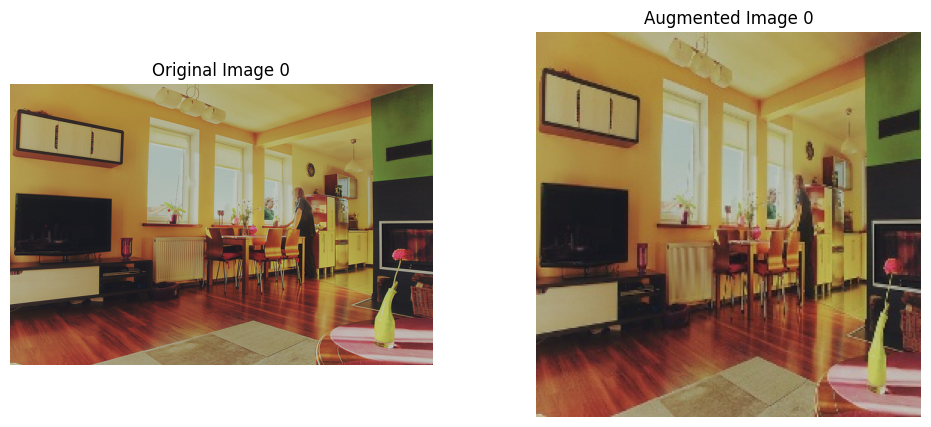

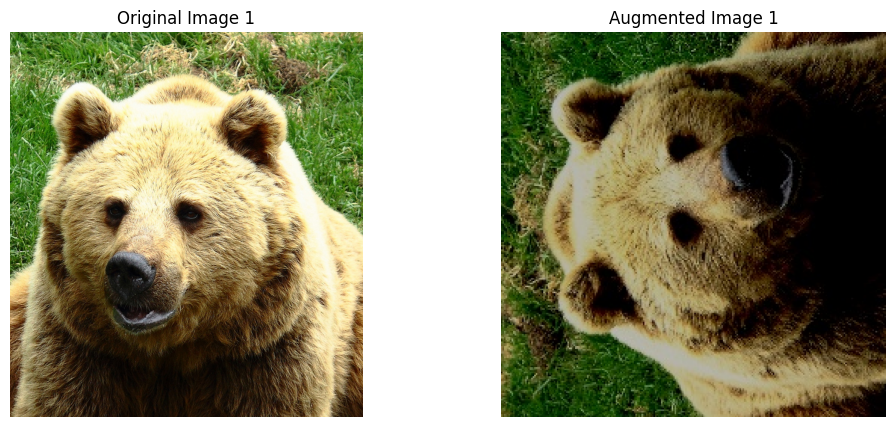

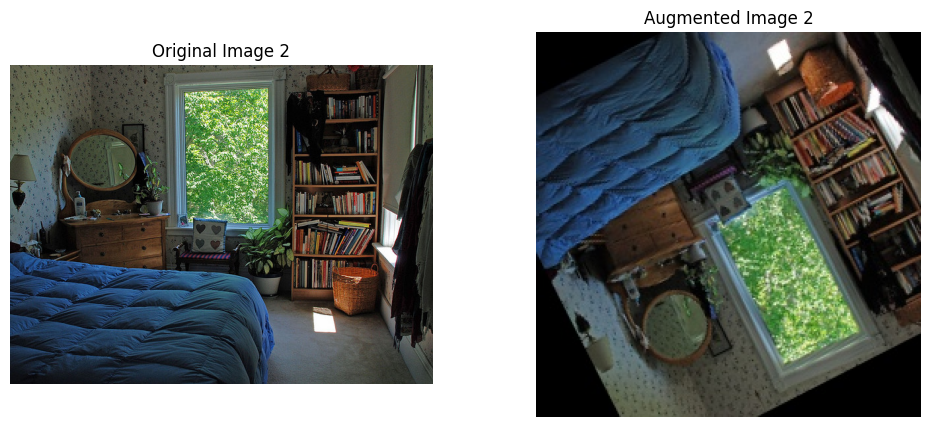

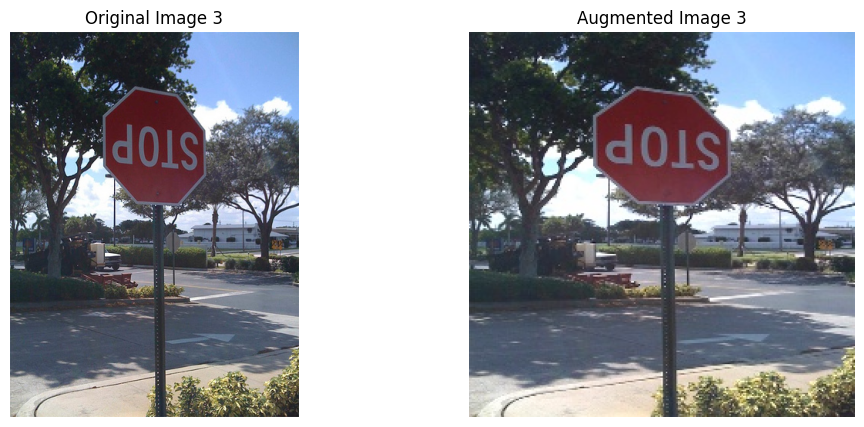

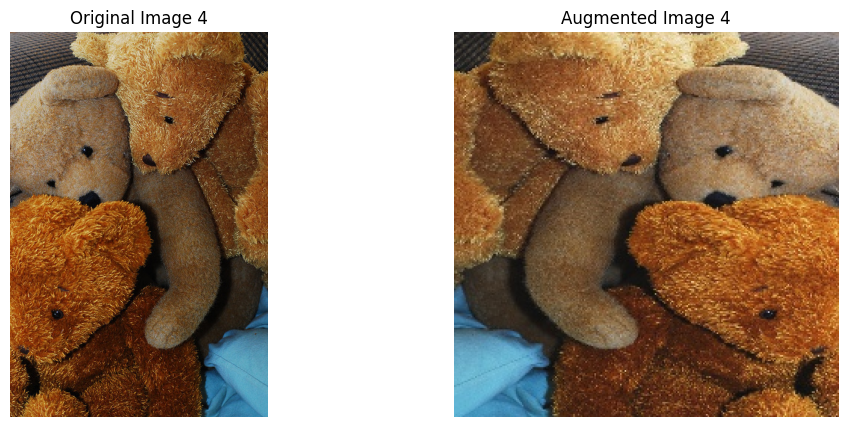

In [12]:
import cv2
import matplotlib.pyplot as plt

# Show comparison for first 5 validation images
for i in range(5):
    # --- Original ---
    orig_path = val_images[i]
    orig_img = cv2.cvtColor(cv2.imread(orig_path), cv2.COLOR_BGR2RGB)

    # --- Augmented ---
    aug_path = f"/content/augmented_dataset/images/aug_{i}.jpg"
    aug_img = cv2.cvtColor(cv2.imread(aug_path), cv2.COLOR_BGR2RGB)

    # Plot side by side
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(orig_img)
    plt.title(f"Original Image {i}")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(aug_img)
    plt.title(f"Augmented Image {i}")
    plt.axis('off')

    plt.show()


In [15]:
# ===============================
# 1. Install library
# ===============================
!pip install segmentation-models-pytorch --quiet

# ===============================
# 2. Imports
# ===============================
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset,DataLoader
import segmentation_models_pytorch as smp

In [16]:

# ======================================
# 2. Dataset Class
# ======================================
class SegmentationDataset(Dataset):
    def __init__(self, img_dir, mask_dir, img_size=(255, 255)):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.img_files = sorted(os.listdir(img_dir))
        self.mask_files = sorted(os.listdir(mask_dir))
        self.img_size = img_size

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_files[idx])
        mask_path = os.path.join(self.mask_dir, self.mask_files[idx])

        # Load image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, self.img_size)
        img = img.astype(np.float32) / 255.0
        img = np.transpose(img, (2, 0, 1))  # CHW
        img = torch.tensor(img, dtype=torch.float32)

        # Load mask
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, self.img_size, interpolation=cv2.INTER_NEAREST)
        mask = (mask > 0).astype(np.float32)  # binary
        mask = np.expand_dims(mask, axis=0)  # (1, H, W)
        mask = torch.tensor(mask, dtype=torch.float32)

        return img, mask

In [17]:
# ===============================
# 3. Model: Pretrained U-Net
# ===============================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = smp.Unet(
    encoder_name="resnet34",       # pretrained encoder
    encoder_weights="imagenet",    # use ImageNet weights
    in_channels=3,                 # RGB images
    classes=1,                     # binary segmentation
).to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

In [18]:
# ===============================
# 4. Loss and Optimizer
# ===============================
criterion = nn.BCEWithLogitsLoss()  # safe with logits
optimizer = optim.Adam(model.parameters(), lr=1e-4)


In [20]:
# ===============================
# 5. DataLoaders
# ===============================
from sklearn.model_selection import train_test_split

IMG_DIR = "/content/augmented_dataset/images"
MASK_DIR = "/content/augmented_dataset/masks"

dataset = SegmentationDataset(IMG_DIR, MASK_DIR)
train_idx, val_idx = train_test_split(list(range(len(dataset))), test_size=0.2, random_state=42)
train_loader = DataLoader(torch.utils.data.Subset(dataset, train_idx), batch_size=4, shuffle=True)
val_loader   = DataLoader(torch.utils.data.Subset(dataset, val_idx), batch_size=4, shuffle=False)


In [22]:
# ===============================
# 6. IoU Metric
# ===============================
def iou_pytorch(preds, targets, threshold=0.5):
    preds = (torch.sigmoid(preds) > threshold).float()
    intersection = (preds * targets).sum()
    union = preds.sum() + targets.sum() - intersection
    if union == 0:
        return 1.0
    return (intersection / union).item()

In [23]:
# ===============================
# 7. Training Loop
# ===============================
num_epochs = 10
for epoch in range(num_epochs):
    # Training
    model.train()
    train_loss, train_iou = 0, 0
    for imgs, masks in train_loader:
        imgs, masks = imgs.to(device), masks.to(device)
        preds = model(imgs)
        loss = criterion(preds, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        train_iou += iou_pytorch(preds, masks)

    # Validation
    model.eval()
    val_loss, val_iou = 0, 0
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(device), masks.to(device)
            preds = model(imgs)
            loss = criterion(preds, masks)
            val_loss += loss.item()
            val_iou += iou_pytorch(preds, masks)

    print(f"Epoch {epoch+1}/{num_epochs} | "
          f"Train Loss: {train_loss/len(train_loader):.4f}, Train IoU: {train_iou/len(train_loader):.4f} | "
          f"Val Loss: {val_loss/len(val_loader):.4f}, Val IoU: {val_iou/len(val_loader):.4f}")

Epoch 1/10 | Train Loss: 0.4323, Train IoU: 0.4707 | Val Loss: 0.3572, Val IoU: 0.5310
Epoch 2/10 | Train Loss: 0.3743, Train IoU: 0.5345 | Val Loss: 0.3500, Val IoU: 0.5359
Epoch 3/10 | Train Loss: 0.3348, Train IoU: 0.5860 | Val Loss: 0.3415, Val IoU: 0.5544
Epoch 4/10 | Train Loss: 0.2983, Train IoU: 0.6222 | Val Loss: 0.3369, Val IoU: 0.5636
Epoch 5/10 | Train Loss: 0.2631, Train IoU: 0.6574 | Val Loss: 0.3514, Val IoU: 0.5550
Epoch 6/10 | Train Loss: 0.2403, Train IoU: 0.6823 | Val Loss: 0.3735, Val IoU: 0.5533
Epoch 7/10 | Train Loss: 0.2227, Train IoU: 0.7083 | Val Loss: 0.3851, Val IoU: 0.5647
Epoch 8/10 | Train Loss: 0.2064, Train IoU: 0.7255 | Val Loss: 0.3670, Val IoU: 0.5787
Epoch 9/10 | Train Loss: 0.1865, Train IoU: 0.7460 | Val Loss: 0.3809, Val IoU: 0.5641
Epoch 10/10 | Train Loss: 0.1802, Train IoU: 0.7567 | Val Loss: 0.3740, Val IoU: 0.5674


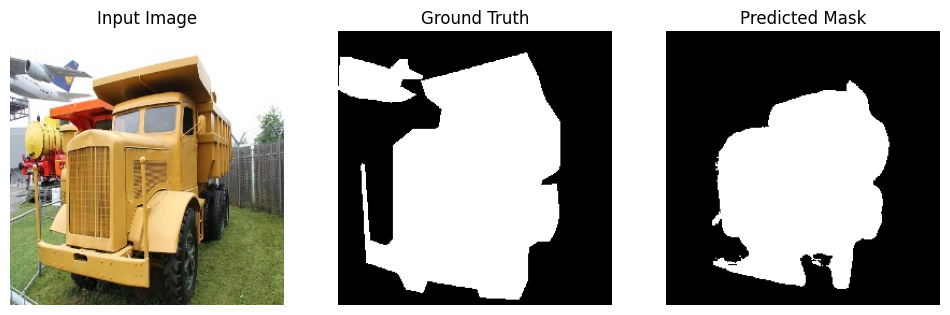

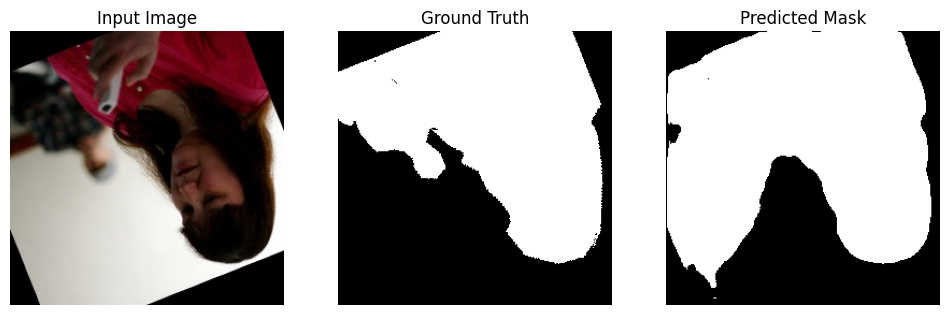

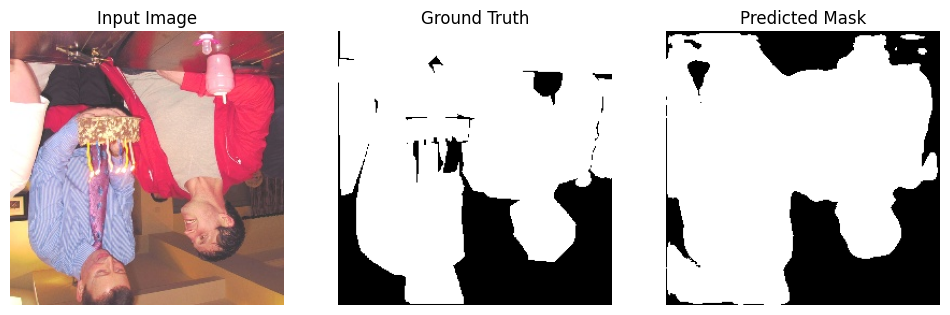

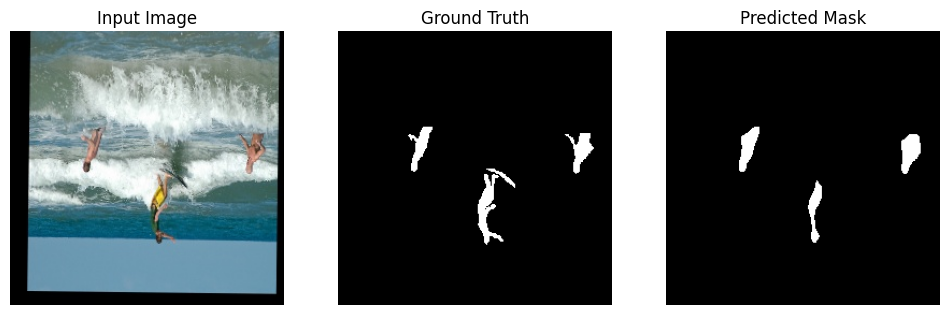

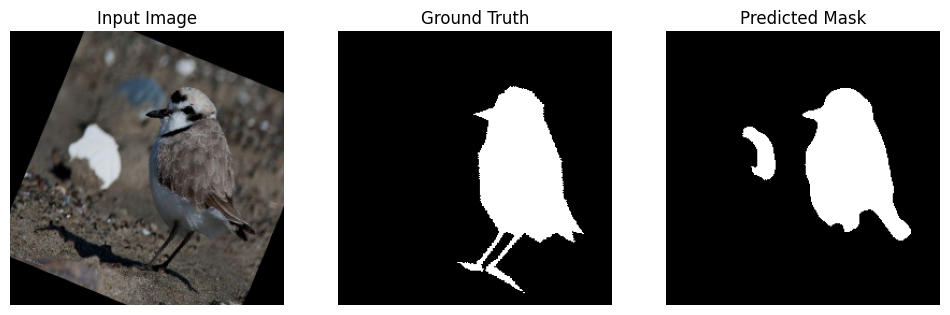

In [24]:
# ===============================
# 8. Visualize Predictions
# ===============================
def visualize_predictions(model, dataloader, device="cuda", num_samples=5):
    model.eval()
    shown = 0
    import matplotlib.pyplot as plt
    with torch.no_grad():
        for imgs, masks in dataloader:
            imgs, masks = imgs.to(device), masks.to(device)
            outputs = torch.sigmoid(model(imgs))
            preds = (outputs > 0.5).float()
            for i in range(imgs.size(0)):
                if shown >= num_samples:
                    return
                img_np  = imgs[i].cpu().numpy().transpose(1,2,0)
                mask_np = masks[i].cpu().numpy().squeeze()
                pred_np = preds[i].cpu().numpy().squeeze()
                plt.figure(figsize=(12,4))
                plt.subplot(1,3,1); plt.imshow(img_np); plt.title("Input Image"); plt.axis('off')
                plt.subplot(1,3,2); plt.imshow(mask_np, cmap='gray'); plt.title("Ground Truth"); plt.axis('off')
                plt.subplot(1,3,3); plt.imshow(pred_np, cmap='gray'); plt.title("Predicted Mask"); plt.axis('off')
                plt.show()
                shown += 1

# Usage
visualize_predictions(model, val_loader, device, num_samples=5)